In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install imageio==2.4.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.3 MB 4.6 MB/s 
  Created wheel for imageio: filename=imageio-2.4.1-py3-none-any.whl size=3303886 sha256=6098fe00dc50be9a0afdcc92ddedc1a2f55fe39fe8dd8dc51f7711c96061b3e6
  Stored in directory: /root/.cache/pip/wheels/be/7b/04/4d8d56f1d503e5c404f0de6018c0cfa592c71588a39b49e002
Successfully built imageio
  Attempting uninstall: imageio
    Found existing installation: imageio 2.9.0
    Uninstalling imageio-2.9.0:
      Successfully uninstalled imageio-2.9.0


In [1]:
# Import the required libraries.
import os
import cv2

import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt
 
from moviepy.editor import *
%matplotlib inline
from keras.layers import Activation, Conv2D, Dropout
from keras.layers import AveragePooling2D, BatchNormalization
from keras.layers import GlobalAveragePooling2D
from keras.models import Sequential
from keras.layers import Flatten
from keras.models import Model
from keras.layers import Input
from keras.layers import MaxPooling2D
from keras.layers import SeparableConv2D
from keras import layers 
from sklearn.model_selection import train_test_split
from keras.layers.core import Dense, Dropout, Activation, Flatten 
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [3]:
# !wget --no-check-certificate "https://www.crcv.ucf.edu/data/UCF50.rar"

In [4]:
# # Extract the Datasetq
# !unrar x "/content/drive/MyDrive/UCF50/UCF50.rar" 

In [5]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)


['bend', 'gallop sideways', 'jump', 'jump in place', 'jumping jack', 'run', 'skip', 'walk', 'wave1', 'wave2']


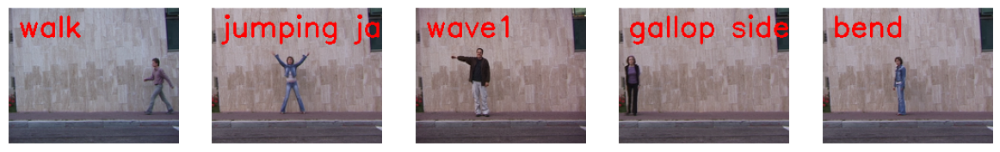

In [7]:
# Create a Matplotlib figure
plt.figure(figsize = (30, 30))
# Get Names of all classes in UCF50
all_classes_names = os.listdir('C:/Users/rubic/Desktop/streamlit/VideoClassificationApp-main/weizmann_dataset')
print(all_classes_names)
# Generate a random sample of images each time the cell runs
random_range = random.sample(range(len(all_classes_names)), 5)
# Iterating through all the random samples
for counter, random_index in enumerate(random_range, 1):
    # Getting Class Name using Random Index
    selected_class_Name = all_classes_names[random_index]
    # Getting a list of all the video files present in a Class Directory
    video_files_names_list = os.listdir(f'C:/Users/rubic/Desktop/streamlit/VideoClassificationApp-main/weizmann_dataset/{selected_class_Name}')
    # Randomly selecting a video file
    selected_video_file_name = random.choice(video_files_names_list)
    # Reading the Video File Using the Video Capture
    video_reader = cv2.VideoCapture(f'C:/Users/rubic/Desktop/streamlit/VideoClassificationApp-main/weizmann_dataset/{selected_class_Name}/{selected_video_file_name}')
    # Reading The First Frame of the Video File
    _, bgr_frame = video_reader.read()
    # Closing the VideoCapture object and releasing all resources.
    video_reader.release()
    # Converting the BGR Frame to RGB Frame
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
    # Adding The Class Name Text on top of the Video Frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    # Assigning the Frame to a specific position of a subplot
    plt.subplot(5, 10, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')


In [35]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 128, 128

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Specify the directory containing the UCF50 dataset. 
DATASET_DIR = "C:/Users/rubic/Desktop/streamlit/VideoClassificationApp-main/weizmann_dataset"

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = ["bend", "gallop sideways", "jump", "jump in place"]

model_output_size = len(CLASSES_LIST)

In [36]:
def frames_extraction(video_path):
  # Empty List declared to store video frames
  frames_list = []
  # Reading the Video File Using the VideoCapture
  video_reader = cv2.VideoCapture(video_path)
  # Iterating through Video Frames
  while True:
      # Reading a frame from the video file
      success, frame = video_reader.read()
      # If Video frame was not successfully read then break the loop
      if not success:
          break
      # Resize the Frame to fixed Dimensions
      resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
      # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
      normalized_frame = resized_frame / 255
      # Appending the normalized frame into the frames list
      frames_list.append(normalized_frame)
  # Closing the VideoCapture object and releasing all resources.
  video_reader.release()
  # returning the frames list
  return frames_list


In [37]:
def create_dataset():
    # Declaring Empty Lists to store the features and labels values.
    temp_features = []
    features = []
    labels = []
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')
        # Getting the list of video files present in the specific class name directory
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        # Iterating through all the files present in the files list
        for file_name in files_list:
            # Construct the complete video path
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
            # Calling the frame_extraction method for every video file path
            frames = frames_extraction(video_file_path)
            # Appending the frames to a temporary list.
            temp_features.extend(frames)
        # Adding randomly selected frames to the features list
        features.extend(random.sample(temp_features, max_images_per_class))
        # Adding Fixed number of labels to the labels list
        labels.extend([class_index] * max_images_per_class)
        # Emptying the temp_features list so it can be reused to store all frames of the next class.
        temp_features.clear()
    # Converting the features and labels lists to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels) 
    return features, labels

In [38]:
features, labels = create_dataset()


Extracting Data of Class: bend
Extracting Data of Class: gallop sideways
Extracting Data of Class: jump
Extracting Data of Class: jump in place


In [39]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)


In [40]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = seed_constant)

In [41]:

from keras.preprocessing.image import ImageDataGenerator

In [42]:
# Let's create a function that will construct our model
def create_model():
    # We will use a Sequential model for model construction
    model = Sequential()
    # Defining The Model Architecture
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', input_shape = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size = (2, 2)))
    
    model.add(Dense(256, activation = 'relu'))
    model.add(BatchNormalization())
    model.add(GlobalAveragePooling2D())
    model.add(Dense(model_output_size, activation = 'softmax'))
    # Printing the models summary
    model.summary()
    return model
# Calling the create_model method
model = create_model()
print("Model Created Successfully!")

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 126, 126, 64)      1792      
                                                                 
 conv2d_7 (Conv2D)           (None, 124, 124, 64)      36928     
                                                                 
 batch_normalization_6 (Batc  (None, 124, 124, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 dense_6 (Dense)             (None, 62, 62, 256)       16640     
                                                                 
 batch_normalization_7 (Batc  (None, 62, 62, 256)     

In [43]:
plot_model(model, to_file = 'model_structure_plot.png', show_shapes = True, show_layer_names = True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [44]:
optim_1= tf.keras.optimizers.SGD(learning_rate=0.0001)

In [45]:
# Adding Early Stopping Callback , callbacks = [early_stopping_callback]
# early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 5, mode = 'min', restore_best_weights = True)
# Adding loss, optimizer and metrics values to the model.
model.compile(loss = 'categorical_crossentropy', optimizer = optim_1, metrics = ["accuracy"])
# Start Training
model_training_history = model.fit(x = features_train,y=labels_train, epochs = 500, batch_size = 32 , shuffle = True, validation_split=0.2)

Epoch 1/500
2/2 [==============================] - 4s 1s/step - loss: 1.3649 - accuracy: 0.3529 - val_loss: 1.3891 - val_accuracy: 0.2308
Epoch 2/500
2/2 [==============================] - 3s 992ms/step - loss: 1.3620 - accuracy: 0.3333 - val_loss: 1.3885 - val_accuracy: 0.2308
Epoch 3/500
2/2 [==============================] - 2s 975ms/step - loss: 1.3651 - accuracy: 0.3725 - val_loss: 1.3880 - val_accuracy: 0.2308
Epoch 4/500
2/2 [==============================] - 3s 1s/step - loss: 1.3703 - accuracy: 0.3529 - val_loss: 1.3875 - val_accuracy: 0.2308
Epoch 5/500
2/2 [==============================] - 2s 964ms/step - loss: 1.3305 - accuracy: 0.3333 - val_loss: 1.3871 - val_accuracy: 0.2308
Epoch 6/500
2/2 [==============================] - 3s 1s/step - loss: 1.3484 - accuracy: 0.3333 - val_loss: 1.3866 - val_accuracy: 0.2308
Epoch 7/500
2/2 [==============================] - 3s 1s/step - loss: 1.3468 - accuracy: 0.3529 - val_loss: 1.3863 - val_accuracy: 0.2308
Epoch 8/500
2/2 [========

In [46]:
model_evaluation_history = model.evaluate(features_test, labels_test)


1/1 [==============================] - 0s 152ms/step - loss: 1.4928 - accuracy: 0.2500


In [47]:
# Creating a useful name for our model, incase you're saving multiple models (OPTIONAL)
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
model_name = f'Model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
# Saving your Model
model.save(model_name)


In [48]:

def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
 
    # Add title to the plot.
    plt.title(str(plot_name))
 
    # Add legend to the plot.
    plt.legend()

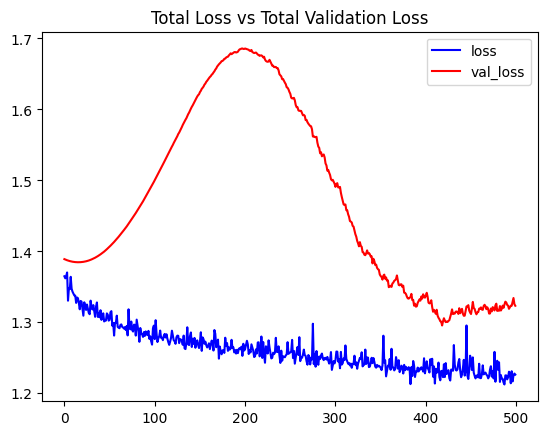

In [49]:

# Visualize the training and validation loss metrices.
plot_metric(model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

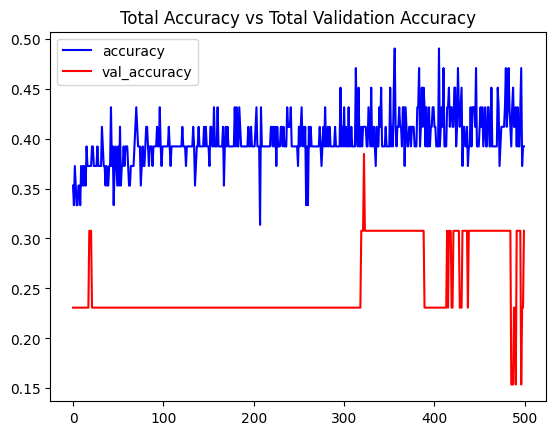

In [50]:

# Visualize the training and validation accuracy metrices.
plot_metric(model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')
    


In [51]:
def predict_on_live_video(video_file_path, output_file_path, window_size):
    # Initialize a Deque Object with a fixed size which will be used to implement moving/rolling average functionality.
    predicted_labels_probabilities_deque = deque(maxlen = window_size)
    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)
    # Getting the width and height of the video
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    # Writing the Overlayed Video Files Using the VideoWriter Object
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 24, (original_video_width, original_video_height))
    while True:
        # Reading The Frame
        status, frame = video_reader.read()
        if not status:
            break
        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]
        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_deque.append(predicted_labels_probabilities)
        # Assuring that the Deque is completely filled before starting the averaging process
        if len(predicted_labels_probabilities_deque) == window_size:
            # Converting Predicted Labels Probabilities Deque into Numpy array
            predicted_labels_probabilities_np = np.array(predicted_labels_probabilities_deque)
            # Calculating Average of Predicted Labels Probabilities Column Wise
            predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)
            # Converting the predicted probabilities into labels by returning the index of the maximum value.
            predicted_label = np.argmax(predicted_labels_probabilities_averaged)
            # Accessing The Class Name using predicted label.
            predicted_class_name = CLASSES_LIST[predicted_label]
            # Overlaying Class Name Text Ontop of the Frame
            cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        # Writing The Frame
        video_writer.write(frame)
        # cv2.imshow('Predicted Frames', frame)
        # key_pressed = cv2.waitKey(10)
        # if key_pressed == ord('q'):
        #     break
    # cv2.destroyAllWindows()
    # Closing the VideoCapture and VideoWriter objects and releasing all resources held by them.
    video_reader.release()
    video_writer.release()


In [54]:

# Make the Output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
# Download a YouTube Video.
video_title = 'C:/Users/rubic/Desktop/streamlit/VideoClassificationApp-main/VideoSample/videoplayback.mp4'
 
# Get the YouTube Video's path we just downloaded.
input_video_file_path = f'C:/Users/rubic/Desktop/streamlit/VideoClassificationApp-main/VideoSample/videoplayback.mp4'

In [55]:
# Setting the Window Size which will be used by the Rolling Average Process
window_size = 25
# Constructing The Output YouTube Video Path
output_video_file_path = f'C:/Users/rubic/Desktop/streamlit/VideoClassificationApp-main/VideoSample/result video.mp4-Output.mp4'
# Calling the predict_on_live_video method to start the Prediction and Rolling Average Process
predict_on_live_video(input_video_file_path, output_video_file_path, window_size)
# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700)


1/1 [==============================] - 0s 36ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [56]:
score1, acc1 = model.evaluate(features_train,labels_train, batch_size=32,verbose=0)
print('Train score1:', score1,'Train accupracy1:', acc1)

Train score1: 1.245969295501709 Train accupracy1: 0.34375


In [57]:
score2, acc2 = model.evaluate(features_test,labels_test, batch_size=32,verbose=0)
print('Test score1:', score2,'Test accuracy1:', acc2)

Test score1: 1.492785930633545 Test accuracy1: 0.25


In [58]:
import numpy as np

y_pred1 = model.predict(features_test)
y_pred=np.argmax(y_pred1,axis=1)
#y_true = tf.math.argmax(testY, axis=1)
y_true = np.argmax(labels_test, axis=-1) #np_utils.categorical_probas_to_classes(y_test)

# Compute a confusion matrix and a normalised confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
cm = confusion_matrix(y_true, y_pred)
cm_normalised = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

1/1 [==============================] - 0s 185ms/step


In [59]:
# These can also be used to produce heatmaps using Matplotlib or Seaborn.
print(cm)
print(cm_normalised)

[[2 0 0 0]
 [1 2 0 0]
 [4 2 0 0]
 [3 1 1 0]]
[[1.         0.         0.         0.        ]
 [0.33333333 0.66666667 0.         0.        ]
 [0.66666667 0.33333333 0.         0.        ]
 [0.6        0.2        0.2        0.        ]]


In [ ]:
classes = CLASSES_LIST
print(classes)

['SkateBoarding', 'PlayingPiano', 'PlayingViolin', 'RockClimbingIndoor']


In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = cm.round(2)
        #print("Normalized confusion matrix")
    else:
        cm=cm
        #print('Confusion matrix, without normalization')

    #print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

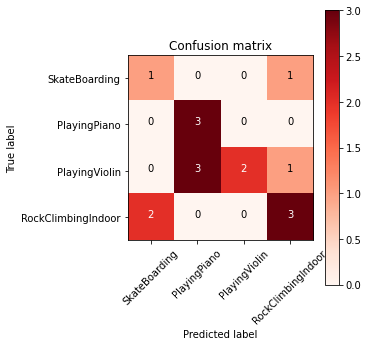

In [ ]:
np.set_printoptions(precision=2)

fig1 = plt.figure(figsize=(5,5))
plot_confusion_matrix(cm, classes=CLASSES_LIST , title='Confusion matrix')
plt.show()

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.33      0.50      0.40         2
           1       0.50      1.00      0.67         3
           2       1.00      0.33      0.50         6
           3       0.60      0.60      0.60         5

    accuracy                           0.56        16
   macro avg       0.61      0.61      0.54        16
weighted avg       0.70      0.56      0.55        16



## ConvLSTM

In [ ]:
 !unrar x "/content/kth/UCF50.rar" 


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal

Cannot open /content/kth/UCF50.rar
No such file or directory
No files to extract


In [ ]:
# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('/content/drive/MyDrive/UCF50')
print(all_classes_names)
 

['UCF50.rar']


['PlayingGuitar', 'PizzaTossing', 'TrampolineJumping', 'Skijet', 'MilitaryParade', 'YoYo', 'TennisSwing', 'BreastStroke', 'JumpingJack', 'Swing', 'HighJump', 'Billiards', 'SkateBoarding', 'PoleVault', 'Lunges', 'PlayingTabla', 'VolleyballSpiking', 'Kayaking', 'HulaHoop', 'Diving', 'JumpRope', 'PommelHorse', 'JugglingBalls', 'PlayingViolin', 'Drumming', 'PushUps', 'BenchPress', 'CleanAndJerk', 'Skiing', 'SoccerJuggling', 'Basketball', 'BaseballPitch', 'WalkingWithDog', 'Rowing', 'Biking', 'SalsaSpin', 'Nunchucks', 'GolfSwing', 'PlayingPiano', 'TaiChi', 'Mixing', 'HorseRace', 'HorseRiding', 'ThrowDiscus', 'PullUps', 'RopeClimbing', 'JavelinThrow', 'Punch', 'Fencing', 'RockClimbingIndoor']


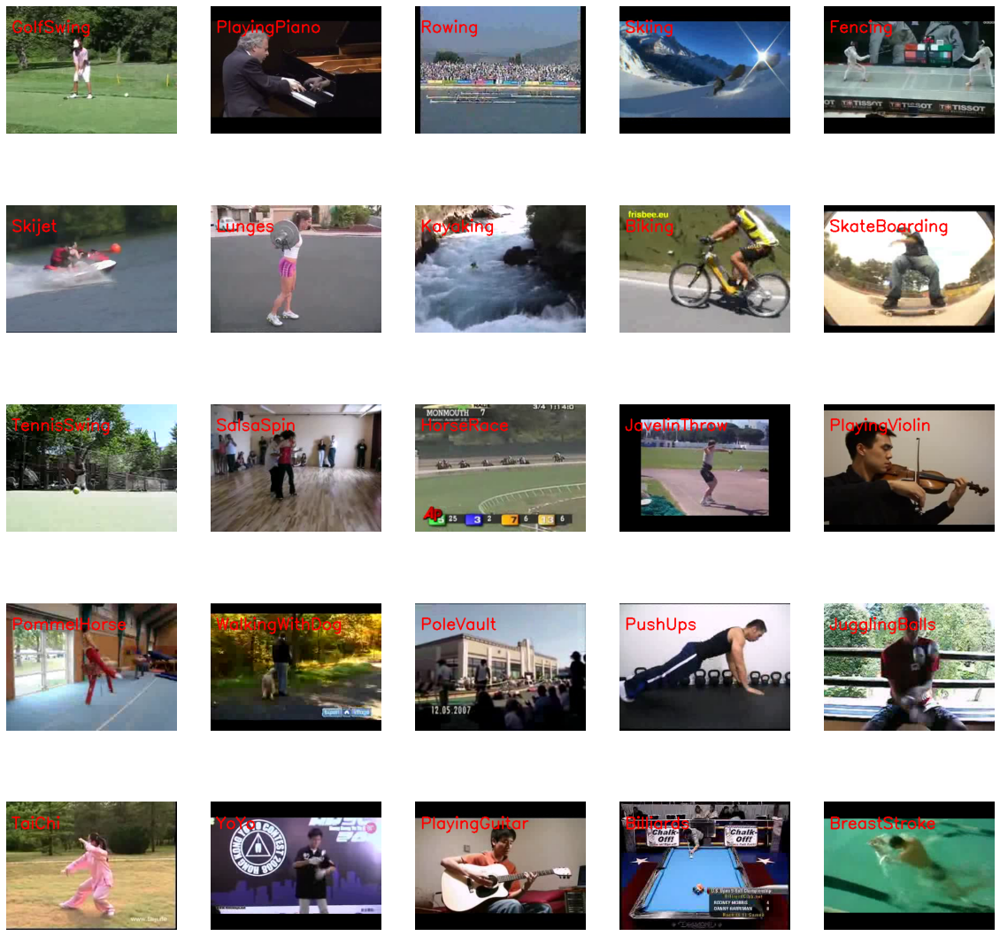

In [ ]:
# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize = (20, 20))
 
# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('/content/UCF50')
print(all_classes_names)
 
# Generate a list of 20 random values. The values will be between 0-50, 
# where 50 is the total number of class in the dataset. 
random_range = random.sample(range(len(all_classes_names)), 25)
 
# Iterating through all the generated random values.
for counter, random_index in enumerate(random_range, 1):
 
    # Retrieve a Class Name using the Random Index.
    selected_class_Name = all_classes_names[random_index]
 
    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    video_files_names_list = os.listdir(f'/content/UCF50/{selected_class_Name}')
 
    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)
 
    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'/content/UCF50/{selected_class_Name}/{selected_video_file_name}')
    
    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()
 
    # Release the VideoCapture object. 
    video_reader.release()
 
    # Convert the frame from BGR into RGB format. 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
 
    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    
    # Display the frame.
    plt.subplot(5, 5, counter);plt.imshow(rgb_frame);plt.axis('off')


In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
max_images_per_class = 20
DATASET_DIR = "/content/UCF50"
CLASSES_LIST = ['HighJump', 'GolfSwing', 'BenchPress', 'SkateBoarding', 'Biking', 'JavelinThrow']

model_output_size = len(CLASSES_LIST)


In [ ]:
def frames_extraction(video_path):
  # Empty List declared to store video frames
  frames_list = []
  # Reading the Video File Using the VideoCapture
  video_reader = cv2.VideoCapture(video_path)
  # Iterating through Video Frames
  while True:
      # Reading a frame from the video file
      success, frame = video_reader.read()
      # If Video frame was not successfully read then break the loop
      if not success:
          break
      # Resize the Frame to fixed Dimensions
      resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
      # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
      normalized_frame = resized_frame / 255
      # Appending the normalized frame into the frames list
      frames_list.append(normalized_frame)
  # Closing the VideoCapture object and releasing all resources.
  video_reader.release()
  # returning the frames list
  return frames_list

In [ ]:
def create_dataset():
    # Declaring Empty Lists to store the features and labels values.
    temp_features = []
    features = []
    labels = []
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')
        # Getting the list of video files present in the specific class name directory
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        # Iterating through all the files present in the files list
        for file_name in files_list:
            # Construct the complete video path
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
            # Calling the frame_extraction method for every video file path
            frames = frames_extraction(video_file_path)
            # Appending the frames to a temporary list.
            temp_features.extend(frames)
        # Adding randomly selected frames to the features list
        features.extend(random.sample(temp_features, max_images_per_class))
        # Adding Fixed number of labels to the labels list
        labels.extend([class_index] * max_images_per_class)
        # Emptying the temp_features list so it can be reused to store all frames of the next class.
        temp_features.clear()
    # Converting the features and labels lists to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels) 
    return features, labels

In [ ]:
features,labels = create_dataset()


Extracting Data of Class: HighJump
Extracting Data of Class: GolfSwing
Extracting Data of Class: BenchPress
Extracting Data of Class: SkateBoarding
Extracting Data of Class: Biking
Extracting Data of Class: JavelinThrow


In [ ]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [ ]:
optim_1= tf.keras.optimizers.RMSprop(learning_rate=0.0001)

In [ ]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = seed_constant)

In [ ]:
# !unrar x "/content/drive/MyDrive/kth/UCF50.rar"

In [ ]:
print(features_train.shape)
print(features_test.shape)
print(labels_train.shape)
print(labels_test.shape)

(96, 64, 64, 3)
(24, 64, 64, 3)
(96, 6)
(24, 6)


In [ ]:
features_train = np.reshape(features_train,(96,1, 64, 64, 3))
features_test = np.reshape(features_test,(24,1, 64, 64, 3))

In [ ]:
def create_convlstm_model():
    '''
    This function will construct the required convlstm model.
    Returns:
        model: It is the required constructed convlstm model.
    '''
 
    # We will use a Sequential model for model construction
    model = Sequential()
 
    # Define the Model Architecture.
    ########################################################################################################################
    
    model.add(ConvLSTM2D(filters = 8, kernel_size = (3, 3), activation = 'tanh',data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape = (1,IMAGE_HEIGHT,IMAGE_WIDTH, 3)))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(Dropout(0.2))
    
    model.add(ConvLSTM2D(filters = 16, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(BatchNormalization())
    
    model.add(ConvLSTM2D(filters = 32, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(BatchNormalization())
    
    model.add(ConvLSTM2D(filters = 64, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(Dropout(0.2))
    
    model.add(Flatten()) 
    
    model.add(Dense(len(CLASSES_LIST), activation = "softmax"))
    
    ########################################################################################################################
     
    # Display the models summary.
    model.summary()
    
    # Return the constructed convlstm model.
    return model

In [ ]:
# Construct the required convlstm model.
convlstm_model = create_convlstm_model()
 
# Display the success message. 
print("Model Created Successfully!")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_4 (ConvLSTM2D)  (None, 1, 62, 62, 8)      3200      
                                                                 
 max_pooling3d_4 (MaxPooling  (None, 1, 31, 31, 8)     0         
 3D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 1, 31, 31, 8)      0         
                                                                 
 conv_lstm2d_5 (ConvLSTM2D)  (None, 1, 29, 29, 16)     13888     
                                                                 
 max_pooling3d_5 (MaxPooling  (None, 1, 15, 15, 16)    0         
 3D)                                                             
                                                                 
 batch_normalization_4 (Batc  (None, 1, 15, 15, 16)   

In [ ]:
convlstm_model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_4 (ConvLSTM2D)  (None, 1, 62, 62, 8)      3200      
                                                                 
 max_pooling3d_4 (MaxPooling  (None, 1, 31, 31, 8)     0         
 3D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 1, 31, 31, 8)      0         
                                                                 
 conv_lstm2d_5 (ConvLSTM2D)  (None, 1, 29, 29, 16)     13888     
                                                                 
 max_pooling3d_5 (MaxPooling  (None, 1, 15, 15, 16)    0         
 3D)                                                             
                                                                 
 batch_normalization_4 (Batc  (None, 1, 15, 15, 16)   

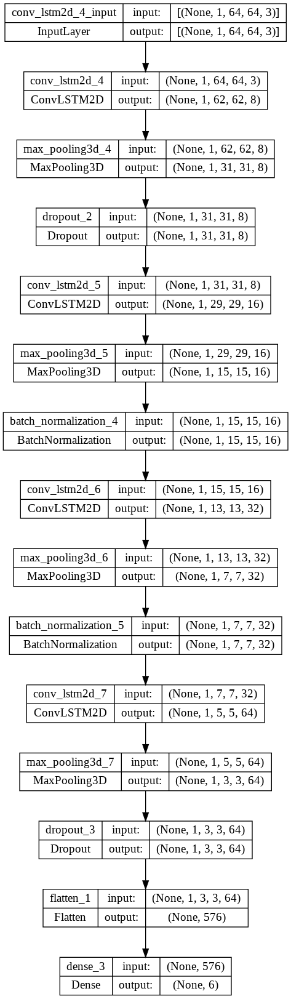

In [ ]:
# Plot the structure of the contructed model.
plot_model(convlstm_model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [ ]:
# Create an Instance of Early Stopping Callback,callbacks = [early_stopping_callback]
# early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 5, mode = 'min', restore_best_weights = True)
 
# Compile the model and specify loss function, optimizer and metrics values to the model
convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = optim_1, metrics = ["accuracy"])
 
# Start training the model.
convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 100, batch_size = 32,shuffle = True, validation_split = 0.2 )

Epoch 1/100
3/3 [==============================] - 13s 568ms/step - loss: 1.7831 - accuracy: 0.1579 - val_loss: 1.7919 - val_accuracy: 0.1000
Epoch 2/100
3/3 [==============================] - 0s 48ms/step - loss: 1.7732 - accuracy: 0.2632 - val_loss: 1.7919 - val_accuracy: 0.1000
Epoch 3/100
3/3 [==============================] - 0s 47ms/step - loss: 1.7583 - accuracy: 0.3816 - val_loss: 1.7920 - val_accuracy: 0.1000
Epoch 4/100
3/3 [==============================] - 0s 51ms/step - loss: 1.7540 - accuracy: 0.3421 - val_loss: 1.7921 - val_accuracy: 0.1000
Epoch 5/100
3/3 [==============================] - 0s 48ms/step - loss: 1.7459 - accuracy: 0.3421 - val_loss: 1.7921 - val_accuracy: 0.1000
Epoch 6/100
3/3 [==============================] - 0s 49ms/step - loss: 1.7391 - accuracy: 0.3684 - val_loss: 1.7922 - val_accuracy: 0.1000
Epoch 7/100
3/3 [==============================] - 0s 50ms/step - loss: 1.7157 - accuracy: 0.4737 - val_loss: 1.7922 - val_accuracy: 0.1000
Epoch 8/100
3/3 [=

In [ ]:
# Evaluate the trained model.
model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

1/1 [==============================] - 0s 76ms/step - loss: 1.7626 - accuracy: 0.3333


In [ ]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
 
# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
 
# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
 
# Save your Model.
convlstm_model.save(model_file_name)

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
 
    # Add title to the plot.
    plt.title(str(plot_name))
 
    # Add legend to the plot.
    plt.legend()

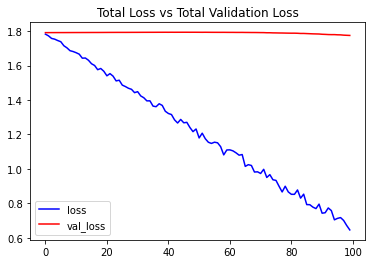

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

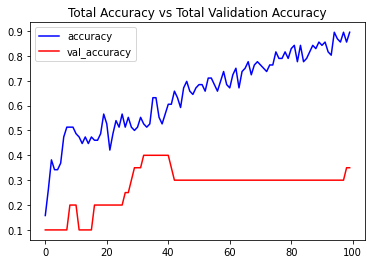

In [ ]:
# Visualize the training and validation accuracy metrices.
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy') 

In [ ]:

# Make the Output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
# Download a YouTube Video.
video_title = '/content/drive/MyDrive/-s-first-gold-medal-in-Olympic-by-neeraj-chopra-whatsapp-status-tamil-India.mp4'
 
# Get the YouTube Video's path we just downloaded.
input_video_file_path = f'/content/drive/MyDrive/-s-first-gold-medal-in-Olympic-by-neeraj-chopra-whatsapp-status-tamil-India.mp4'

In [ ]:
SEQUENCE_LENGTH=1

In [ ]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform action recognition on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    output_file_path: The path where the ouput video with the predicted action being performed overlayed will be stored.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''
 
    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Initialize the VideoWriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        # Read the frame.
        ok, frame = video_reader.read() 
        
        # Check if frame is not read properly then break the loop.
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT,IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255
 
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
 
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = convlstm_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
 
        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
 
        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)
        
    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()

In [ ]:
# Construct the output video path.
output_video_file_path = f'/content/yt1s.com - Test Video.mp4-Output.mp4'
 
# Perform Action Recognition on the Test Video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
 
# Display the output video.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

In [ ]:
score1, acc1 = convlstm_model.evaluate(features_train,labels_train, batch_size=25,verbose=0)
print('Train score1:', score1,'Train accuracy1:', acc1)

Train score1: 1.7266079187393188 Train accuracy1: 0.4270833432674408


In [ ]:
score2, acc2 = convlstm_model.evaluate(features_test,labels_test, batch_size=25,verbose=0)
print('Test score1:', score2,'Test accuracy1:', acc2)

Test score1: 1.7626079320907593 Test accuracy1: 0.3333333432674408


In [ ]:
import numpy as np

y_pred1 = convlstm_model.predict(features_test)
y_pred=np.argmax(y_pred1,axis=1)
#y_true = tf.math.argmax(testY, axis=1)
y_true = np.argmax(labels_test, axis=-1) #np_utils.categorical_probas_to_classes(y_test)

# Compute a confusion matrix and a normalised confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
cm = confusion_matrix(y_true, y_pred)
cm_normalised = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

1/1 [==============================] - 0s 22ms/step


In [ ]:
# These can also be used to produce heatmaps using Matplotlib or Seaborn.
print(cm)
print(cm_normalised)

[[0 2 0 0 1 0]
 [0 2 0 0 0 1]
 [0 0 0 0 1 3]
 [0 1 0 0 1 2]
 [0 2 0 1 3 0]
 [0 1 0 0 0 3]]
[[0.   0.67 0.   0.   0.33 0.  ]
 [0.   0.67 0.   0.   0.   0.33]
 [0.   0.   0.   0.   0.25 0.75]
 [0.   0.25 0.   0.   0.25 0.5 ]
 [0.   0.33 0.   0.17 0.5  0.  ]
 [0.   0.25 0.   0.   0.   0.75]]


In [ ]:

classes = CLASSES_LIST
print(classes)

['HighJump', 'GolfSwing', 'BenchPress', 'SkateBoarding', 'Biking', 'JavelinThrow']


In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = cm.round(2)
        #print("Normalized confusion matrix")
    else:
        cm=cm
        #print('Confusion matrix, without normalization')

    #print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

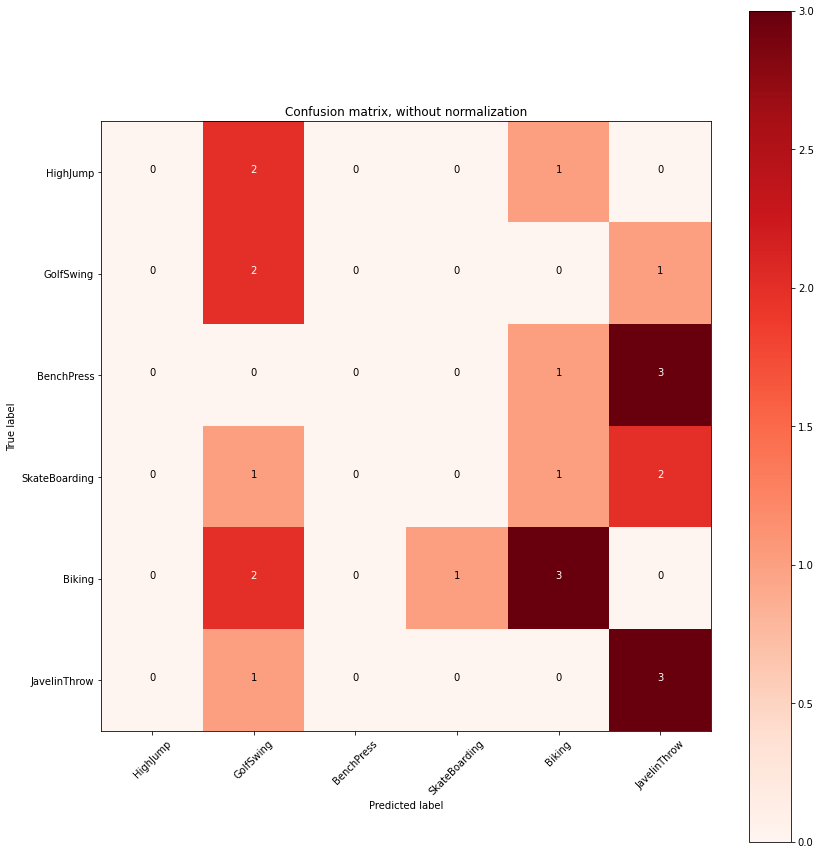

In [ ]:
np.set_printoptions(precision=2)

fig1 = plt.figure(figsize=(12,12))
plot_confusion_matrix(cm, classes=CLASSES_LIST, title='Confusion matrix, without normalization')
plt.show()

In [ ]:
from sklearn.metrics import classification_report 

In [ ]:
print(classification_report(y_true, y_pred))

  _warn_prf(average, modifier, msg_start, len(result))

  _warn_prf(average, modifier, msg_start, len(result))

  _warn_prf(average, modifier, msg_start, len(result))



              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.25      0.67      0.36         3
           2       0.00      0.00      0.00         4
           3       0.00      0.00      0.00         4
           4       0.50      0.50      0.50         6
           5       0.33      0.75      0.46         4

    accuracy                           0.33        24
   macro avg       0.18      0.32      0.22        24
weighted avg       0.21      0.33      0.25        24



## vgg 16

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH = 128, 128

In [ ]:
model = Sequential()
model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu",input_shape = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Flatten())
model.add(Dense(units=128,activation="relu"))
model.add(Dense(units=64,activation="relu"))
model.add(Dense(units=50, activation="softmax"))

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 conv2d_29 (Conv2D)          (None, 128, 128, 64)      36928     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 64, 64, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 64, 64, 128)       73856     
                                                                 
 conv2d_31 (Conv2D)          (None, 64, 64, 128)       147584    
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 32, 32, 128)      0         
 g2D)                                                 

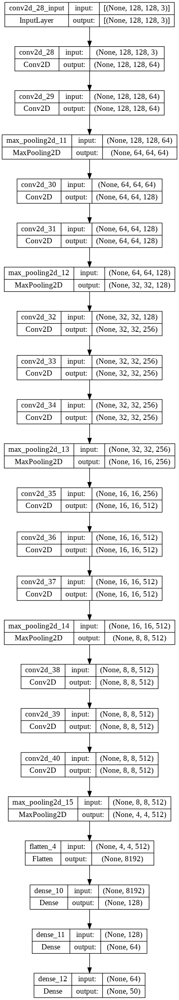

In [ ]:
# Plot the structure of the contructed model.
plot_model(model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [ ]:
# Create an Instance of Early Stopping Callback,callbacks = [early_stopping_callback]
# early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 5, mode = 'min', restore_best_weights = True)
 
# Compile the model and specify loss function, optimizer and metrics values to the model
model.compile(loss = 'categorical_crossentropy', optimizer = optim_1, metrics = ["accuracy"])
 
# Start training the model.
convlstm_model_training_history = model.fit(x = features_train, y = labels_train, epochs = 100, batch_size = 32,shuffle = True, validation_split = 0.2 )

Epoch 1/100


ValueError: ignored

In [ ]:
# Evaluate the trained model.
model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

1/1 [==============================] - 0s 76ms/step - loss: 1.7626 - accuracy: 0.3333


In [ ]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
 
# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
 
# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
 
# Save your Model.
convlstm_model.save(model_file_name)

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))
 
    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
 
    # Add title to the plot.
    plt.title(str(plot_name))
 
    # Add legend to the plot.
    plt.legend()

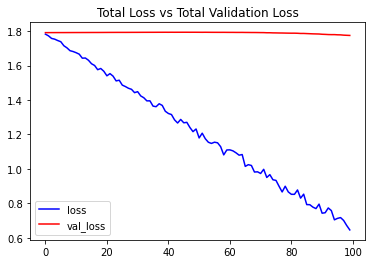

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

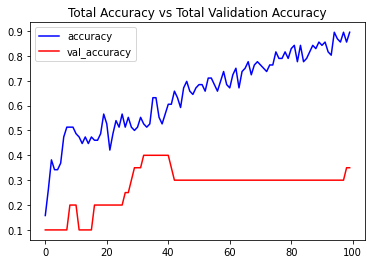

In [ ]:
# Visualize the training and validation accuracy metrices.
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy') 

In [ ]:

# Make the Output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
# Download a YouTube Video.
video_title = '/content/drive/MyDrive/-s-first-gold-medal-in-Olympic-by-neeraj-chopra-whatsapp-status-tamil-India.mp4'
 
# Get the YouTube Video's path we just downloaded.
input_video_file_path = f'/content/drive/MyDrive/-s-first-gold-medal-in-Olympic-by-neeraj-chopra-whatsapp-status-tamil-India.mp4'

In [ ]:
SEQUENCE_LENGTH=1

In [ ]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform action recognition on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    output_file_path: The path where the ouput video with the predicted action being performed overlayed will be stored.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''
 
    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Initialize the VideoWriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        # Read the frame.
        ok, frame = video_reader.read() 
        
        # Check if frame is not read properly then break the loop.
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT,IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255
 
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
 
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = convlstm_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
 
        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
 
        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)
        
    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()

In [ ]:
# Construct the output video path.
output_video_file_path = f'/content/yt1s.com - Test Video.mp4-Output.mp4'
 
# Perform Action Recognition on the Test Video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
 
# Display the output video.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 942/943 [00:02<00:00, 362.66it/s]


In [ ]:
score1, acc1 = convlstm_model.evaluate(features_train,labels_train, batch_size=25,verbose=0)
print('Train score1:', score1,'Train accuracy1:', acc1)

Train score1: 1.7266079187393188 Train accuracy1: 0.4270833432674408


In [ ]:
score2, acc2 = convlstm_model.evaluate(features_test,labels_test, batch_size=25,verbose=0)
print('Test score1:', score2,'Test accuracy1:', acc2)

Test score1: 1.7626079320907593 Test accuracy1: 0.3333333432674408


In [ ]:
import numpy as np

y_pred1 = convlstm_model.predict(features_test)
y_pred=np.argmax(y_pred1,axis=1)
#y_true = tf.math.argmax(testY, axis=1)
y_true = np.argmax(labels_test, axis=-1) #np_utils.categorical_probas_to_classes(y_test)

# Compute a confusion matrix and a normalised confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
cm = confusion_matrix(y_true, y_pred)
cm_normalised = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

1/1 [==============================] - 0s 22ms/step


In [ ]:
# These can also be used to produce heatmaps using Matplotlib or Seaborn.
print(cm)
print(cm_normalised)

[[0 2 0 0 1 0]
 [0 2 0 0 0 1]
 [0 0 0 0 1 3]
 [0 1 0 0 1 2]
 [0 2 0 1 3 0]
 [0 1 0 0 0 3]]
[[0.   0.67 0.   0.   0.33 0.  ]
 [0.   0.67 0.   0.   0.   0.33]
 [0.   0.   0.   0.   0.25 0.75]
 [0.   0.25 0.   0.   0.25 0.5 ]
 [0.   0.33 0.   0.17 0.5  0.  ]
 [0.   0.25 0.   0.   0.   0.75]]


In [ ]:

classes = CLASSES_LIST
print(classes)

['HighJump', 'GolfSwing', 'BenchPress', 'SkateBoarding', 'Biking', 'JavelinThrow']


In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = cm.round(2)
        #print("Normalized confusion matrix")
    else:
        cm=cm
        #print('Confusion matrix, without normalization')

    #print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

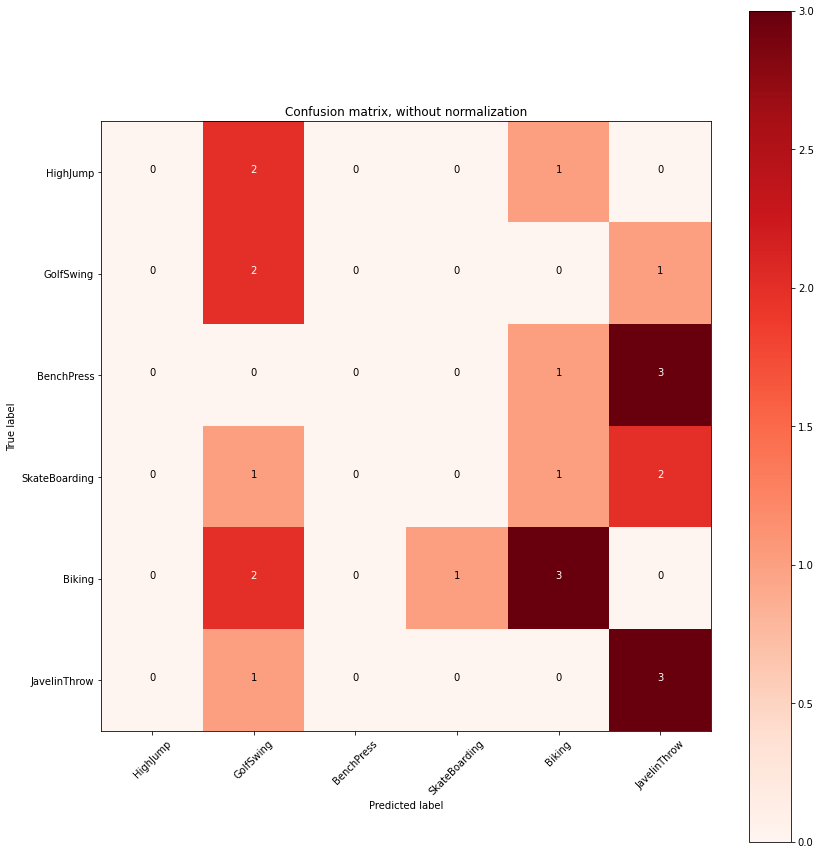

In [ ]:
np.set_printoptions(precision=2)

fig1 = plt.figure(figsize=(12,12))
plot_confusion_matrix(cm, classes=CLASSES_LIST, title='Confusion matrix, without normalization')
plt.show()

In [ ]:
from sklearn.metrics import classification_report 

In [ ]:
print(classification_report(y_true, y_pred))

  _warn_prf(average, modifier, msg_start, len(result))

  _warn_prf(average, modifier, msg_start, len(result))

  _warn_prf(average, modifier, msg_start, len(result))



              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.25      0.67      0.36         3
           2       0.00      0.00      0.00         4
           3       0.00      0.00      0.00         4
           4       0.50      0.50      0.50         6
           5       0.33      0.75      0.46         4

    accuracy                           0.33        24
   macro avg       0.18      0.32      0.22        24
weighted avg       0.21      0.33      0.25        24

